In [25]:
using Plots
include("utils.jl");

$$\Psi(x)=e^{-\lambda x^2+bx}\sum_{\{h\}}e^{(c+xW)h}=e^{-\lambda x^2+bx}\prod_{j}^{N_h}(1+e^{c_j+xW_j})$$

In [44]:
"""Constants in the test"""

λ = 0.5
b = 0.
N_h = 16
c = -Complex.(zeros(N_h))
# w = [(0. +1im),(0. +1im)]
;

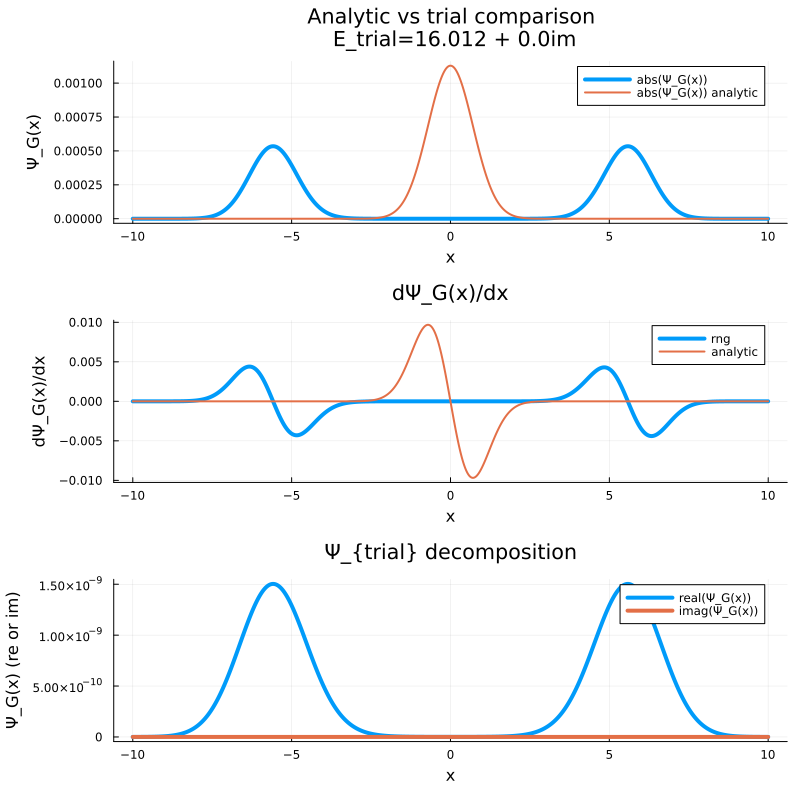

In [40]:
# generate symetric random w such that w_j~N(0,1)

half_w = Complex.(randn(Int32(N_h//2)), randn(Int32(N_h//2)))
# a = 1.0
# b = 1.0
# c = -1.0
# d = -1.0
# # half_w = [(a +b*1im),(c + d*1im)]
# half_w = [1.599 - 0.431im, 1.191 - 0.18im]
half_w = [-1.005, 1.045, 0.176, -0.329, 1.599, 0.02, -0.393, 1.393]

w = Complex.(vcat(half_w, -half_w));

# range of the domain
xmin = -10
xmax = 10
n = 10000
x = range(xmin, stop = xmax, length = n)

# compute the trial wf
y = Complex.(ones(n))
for i = 1:n
    y[i] = Ψ_G(x[i], λ, b, c, w)
end

# compute the trial wf energy
E = round(energy(λ, b, c, w,xmin, xmax, n ), digits=3)


# use the same methods to compute the exact ground state wf λ=0.5, b=0, c=0, w=0
y_analytic = Complex.(ones(n))
for i = 1:n
    y_analytic[i] = Ψ_G(x[i], 0.5, 0., 0., 0.)
end

# compute the exact ground state wf energy
E_a = round(energy(0.5, 0., 0., 0.), digits=3)

# Calculate the probability of the trial wf and the exact wf
prob = abs.(y).^2/sum(abs.(y).^2)
analytic_prob = abs.(y_analytic).^2/sum(abs.(y_analytic).^2)

p1 = plot()

# title = "Ψ_G(x) for \n b = $b, \nc=$c, \nw=$w"

plot!(x, prob, label = "abs(Ψ_G(x))", xlabel = "x", ylabel = "Ψ_G(x)", title = "Analytic vs trial comparison\n E_trial=$E", lw = 4)
plot!(x, analytic_prob, label = "abs(Ψ_G(x)) analytic", lw = 2)

p2 = plot()

plot!(x[1:end-1],df(prob), label = "rng", lw = 4, title="dΨ_G(x)/dx", ylabel="dΨ_G(x)/dx", xlabel="x")
plot!(x[1:end-1],df(analytic_prob), label = "analytic", lw = 2)

p3 = plot()

plot!(x, real.(y)./sum(abs.(y).^2), label = "real(Ψ_G(x))", lw = 4, xlabel="x", ylabel="Ψ_G(x) (re or im)", title="Ψ_{trial} decomposition")
# plot!(x, real.(y_analytic)./sum(abs.(y_analytic).^2), label = "real(Ψ_G(x)) analytic", lw = 2)
plot!(x, imag.(y)./sum(abs.(y).^2), label = "imag(Ψ_G(x))", lw = 4)

plot(p1, p2, p3, layout = (3,1), size = (800, 800))



In [39]:
println(round.(imag.(w[1:8]),digits=3))

[-0.269, -0.223, -1.044, -0.067, -1.557, 0.326, 0.333, -0.1]


If we want the wf to be symmetric, $N_h$ must be even. On top of that, $W$ must have $N_h$ degrees of freedom. The others are fixed such that $W_{j+N_h}=-W_j\ j=1,2,...,N_h/2$

In [5]:
energy(λ, b, c, w)

1.001980448730756 - 3.609254405068328e-13im

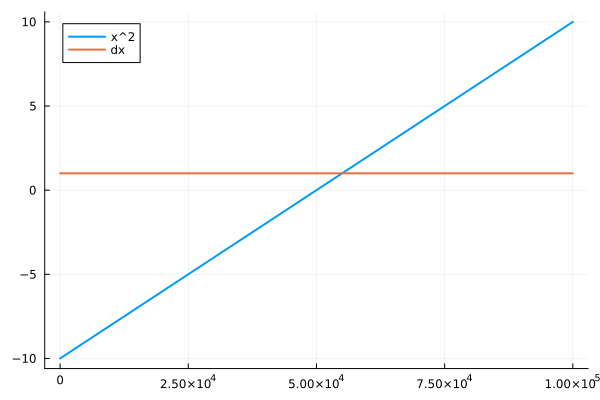

In [6]:
x_test = range(-10, stop = 10, length = 100000)
y_test = x_test
plot(y_test, label = "x^2", lw = 2)
plot!(df(y_test), label = "dx", lw = 2)

In [11]:
println(round.(w, digits=3))

ComplexF64[1.599 - 0.431im, 1.191 - 0.18im, -1.599 + 0.431im, -1.191 + 0.18im]


In [61]:
function Hermite(x,n)
    if n == 0
        return 1
    elseif n == 1
        return 2*x
    else
        return 2*x*Hermite(x,n-1) - 2*(n-1)*Hermite(x,n-2) # Recurrence relation of Hermite polynomials
    end
end

Hermite (generic function with 1 method)

In [62]:
function Ψ_exact(x,n)
    return 1/sqrt(2^n*factorial(n))*π^(-1/4)*Hermite(x,n)*exp(-x^2/2)
end

Ψ_exact (generic function with 1 method)

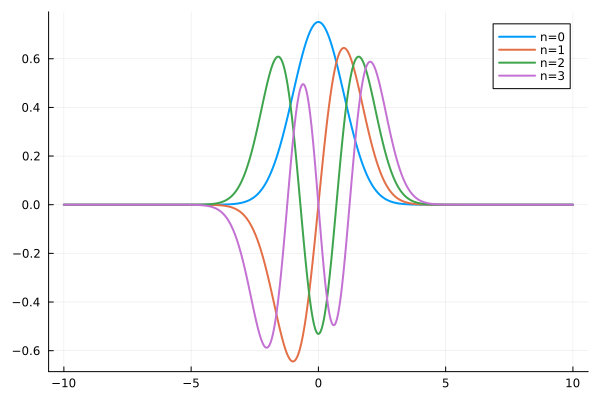

In [64]:
x = range(-10, stop = 10, length = 1000)
plot(x, Ψ_exact.(x,0), label = "n=0", lw = 2)
plot!(x, Ψ_exact.(x,1), label = "n=1", lw = 2)
plot!(x, Ψ_exact.(x,2), label = "n=2", lw = 2)
plot!(x, Ψ_exact.(x,3), label = "n=3", lw = 2)


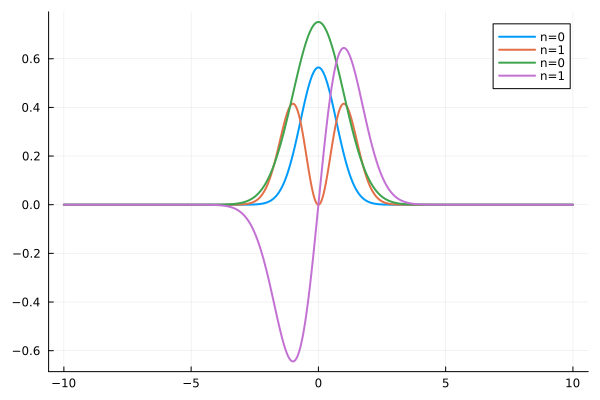

In [68]:
plot(x, Ψ_exact.(x,0).^2, label = "n=0", lw = 2)
plot!(x, Ψ_exact.(x,1).^2, label = "n=1", lw = 2)
plot!(x, Ψ_exact.(x,0), label = "n=0", lw = 2)
plot!(x, Ψ_exact.(x,1), label = "n=1", lw = 2)
# plot!(x, Ψ_exact.(x,2).^2, label = "n=2", lw = 2)
# plot!(x, Ψ_exact.(x,3).^2, label = "n=3", lw = 2)

In [38]:
using Zygote

In [39]:
function ∇f(f,x)
    return gradient(x->f(x),x)
end

using Plots

x_range = Array(range(-10, stop = 10, length = 10))

∇f.(x->x^2,x_range)

# plot(x_range, x->x^2, label = "x^2", lw = 2)


# plot!(x_range, ∇f.(x->x^2,x_range), label = "dx", lw = 2)

# plot!(x_range, x->2*x, label = "2x", lw = 2)

10-element Vector{Tuple{Float64}}:
 (-20.0,)
 (-15.555555555555555,)
 (-11.11111111111111,)
 (-6.666666666666667,)
 (-2.2222222222222223,)
 (2.2222222222222223,)
 (6.666666666666667,)
 (11.11111111111111,)
 (15.555555555555555,)
 (20.0,)

In [40]:
x = [1.,1.,2.]

x |> sum |> sqrt

2.0

In [ ]:
function σ(x)
    return 1/(1+exp(-x))
end

function energy(λ, b, c, w, position=0.0, xmin=-10, xmax=10, n=100000)
    x_vec = range(xmin, xmax, length=n)
    h = sum(x[2:end].-x[1:end-1])/(length(x)-1)
    probability = abs2.(Ψ_G.(x_vec, λ, b, c, w))

    d2ψ(x) = hessian(x->Ψ_G(x,λ,b,c,w),x) # second derivative
    Tloc = -0.5.*d2ψ.(x_vec) ./ (Ψ_G.(x_vec, λ, b, c, w)) # local kinetic energy
    Vloc =  (0.5 .*x_vec.^2) # local potential energy
    Eloc =  (Tloc + Vloc) # local energy
    return real(Simpson(probability .* Eloc,h) / Simpson(probability,h)) # expectation value of the energy
end

energy (generic function with 5 methods)

In [ ]:
function energy2(λ, b, c, w, position=0.0, xmin=-10, xmax=10, n=100000)
    x_vec = range(xmin, xmax, length=n)
    h = sum(x[2:end].-x[1:end-1])/(length(x)-1)
    probability = abs2.(Ψ_G.(x_vec, λ, b, c, w))

    d2ψ(x) = hessian(x->Ψ_G(x,λ,b,c,w),x) # second derivative
    Tloc = -0.5.*d2ψ.(x_vec) ./ (Ψ_G.(x_vec, λ, b, c, w)) # local kinetic energy
    Vloc =  (0.5 .*x_vec.^2) # local potential energy
    Eloc =  (Tloc + Vloc) # local energy
    return real(Simpson(probability .* Eloc,h) / Simpson(probability,h)) # expectation value of the energy
end

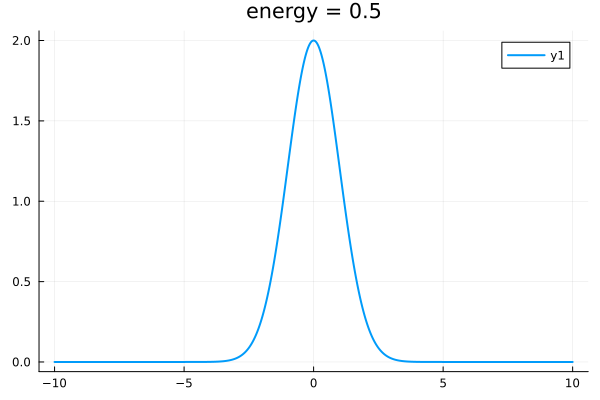

In [92]:
x = range(-10, stop = 10, length = 100000)
plot(x,x->Ψ_G(x, 0.5, 0., 0., 0.), title="energy = $(energy(0.5, 0., 0., 0.))", lw = 2)

In [93]:
gradient(λ->energy(λ,0.,0.,0.), 0.5)

┌ Warning: `ForwardDiff.derivative(f, x)` within Zygote cannot track gradients with respect to `f`,
│ and `f` appears to be a closure, or a struct with fields (according to `issingletontype(typeof(f))`).
│ typeof(f) = Zygote.var"#141#142"{var"#415#417"{Float64, Float64, Float64, Float64}}
└ @ Zygote C:\Users\Usuario\.julia\packages\Zygote\3To5I\src\lib\forward.jl:158


ErrorException: Mutating arrays is not supported -- called setindex!(Vector{Float64}, ...)
This error occurs when you ask Zygote to differentiate operations that change
the elements of arrays in place (e.g. setting values with x .= ...)

Possible fixes:
- avoid mutating operations (preferred)
- or read the documentation and solutions for this error
  https://fluxml.ai/Zygote.jl/latest/limitations
